In [1]:
!pip install torch numba tensorflow_ranking

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 59.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.4/150.4 kB 40.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.6/34.6 MB 47.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 66.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 588.3/588.3 MB 4.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.2/439.2 kB 65.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 96.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 103.6 MB/s eta 0:00:0000:01
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully uninstalled flatbuffers-1.12
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2

In [3]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

from soft_dtw_cuda import SoftDTW
import torch


import sklearn
from sklearn.decomposition import PCA
from sklearn.utils import class_weight
from sklearn.metrics import f1_score
from sklearn.utils import shuffle
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

import pickle


import datetime, csv, os, re, sys
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import auc, f1_score, precision_score, precision_recall_curve, recall_score, roc_curve
from sklearn.model_selection import StratifiedKFold

from scaler import CustomScaler

from featurize import filter, featurize
from sklearn.neural_network import MLPClassifier


In [4]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

from sklearn.decomposition import PCA
from sklearn.utils import class_weight
from sklearn.metrics import f1_score
import sklearn

import pickle

from featurize import featurize

from scaler import CustomScaler


2023-02-24 09:30:08.219311: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-24 09:30:09.069358: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-24 09:30:09.069488: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-24 09:30:09.069499: W tensorfl

In [5]:
tf.get_logger().setLevel('ERROR')

device_name = tf.test.gpu_device_name()

file_name = "raw_with_maps" # or offsets_2

x_data = np.load(f"data/processed/x_{file_name}_filtered.npy")[:,:,[0,1,2,4,5,6]]

#from featurize import filter as _filter, ORDER, CUTOFF, FILTER_INDICES
#x_data = _filter(x_data, FILTER_INDICES, ORDER, CUTOFF)


y_user = np.load(f"data/processed/y_user_{file_name}.npy")
y_intent = np.load(f"data/processed/y_intent_{file_name}.npy").astype(int)
y_gesture = np.load(f"data/processed/y_gesture_type_{file_name}.npy")

train_gesture_map = np.load(f"data/processed/train_gesture_map_{file_name}.npy").astype(int)
test_gesture_map = np.load(f"data/processed/test_gesture_map_{file_name}.npy").astype(int)

x_features = np.load(f"data/processed/x_{file_name}_features.npy")
###



In [6]:
sdtw = SoftDTW(True)

device = torch.device('cuda') 

t1 = torch.Tensor(x_data[:128,:]).to(device)
t2 = torch.Tensor(x_data[128:256,:]).to(device)

sdtw(t1, t2) / 6 / 200

tensor([ 447.9602,  296.7051,  251.3537,  229.4401,  168.3694, 2569.7375,
         228.4029,  369.0240,  434.1048,  939.8164, 5056.7803,  561.4628,
         318.0997,  363.3827,  257.9122,  844.1476,  244.4648, 1201.3878,
         166.2058, 1164.2930, 1485.9473,  781.4905, 1274.3390,  163.9621,
         217.6561,  276.1931,  370.1490,  244.6925,  349.9376,  480.8773,
        1375.4231,  241.9551,  133.6882,  157.4651,   33.5644,  214.7946,
          40.1537,   42.8508,  176.7847,  805.4948,  251.0384, 1592.7596,
         498.8512,  171.9740,  498.2848,  164.1941,  103.3290, 1095.0404,
         110.6895,  539.5513,  818.9766, 1228.8468,  828.6550,  372.7563,
         217.6442,  278.5161,  310.4464, 1122.8671,  515.4677,  289.3485,
         627.2731,  338.8883,  524.2931,  233.0529,  113.5973,  819.3671,
         219.4179,  330.4420,  100.1155,  217.8064,  591.3387, 1540.3049,
         130.6131,   70.5969,  787.6583,  792.0731,   66.7095,  158.1297,
         154.4569, 3009.0583,  507.021

In [143]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

class Sampling(nn.Module):
    """Uses (z_mean, z_log_var) to sample z."""

    def forward(self, inputs):
        z_mean, z_log_var = inputs
        batch = z_mean.size(0)
        dim = z_mean.size(1)
        epsilon = torch.randn(batch, dim, device=z_mean.device)
        return z_mean + torch.exp(0.5 * z_log_var) * epsilon


class Encoder(nn.Module):
    """ (batch, channels, time) """
    def __init__(self, latent_dim):
        super(Encoder, self).__init__()
        
        self.latent_dim = latent_dim
        
        self.conv_layers = nn.Sequential(
            nn.Conv1d(6, 6*100, kernel_size=10, stride=2, padding=5, groups=6),
            nn.MaxPool1d(kernel_size=2),
            nn.Conv1d(6*100, 6*100, kernel_size=3, stride=1, padding=1, groups=6),
            nn.MaxPool1d(kernel_size=2),
        )
        self.lstm = nn.LSTM(input_size=100*6, hidden_size=50, batch_first=True)
        self.dense1 = nn.Linear(50, 50)
        self.dense2 = nn.Linear(50, 50)
        self.dense_mean = nn.Linear(50, self.latent_dim)
        self.dense_log_var = nn.Linear(50, self.latent_dim)

    def forward(self, inputs):
        xs = []
        x = inputs
        x = self.conv_layers(x)
        x = torch.transpose(x, 1,2)
        _, x = self.lstm(x)
        x = x[0]
        x = x.squeeze()
        
        x = F.relu(self.dense1(x))
        x = F.dropout(x, p=0.1, training=self.training)
        x = F.relu(self.dense2(x))
        x = F.dropout(x, p=0.1, training=self.training)
        z_mean = self.dense_mean(x)
        z_log_var = self.dense_log_var(x)
        z = Sampling()([z_mean, z_log_var])
        return z_mean, z_log_var, z
    
class Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(Decoder, self).__init__()
        self.latent_dim = latent_dim

        self.repeat = nn.ReplicationPad1d((0, 0, 24, 0))
        self.lstm = nn.LSTM(input_size=latent_dim,
                            hidden_size=96,
                            batch_first=True,
                            dropout=0.2,
                            bidirectional=True)
        
        #self.tdd = nn.Conv2d(1, 100, (96*2, 1))
        #self.td_dense = nn.Linear(200, 100)
        lstm_out_dim = 96*2
        self.conv1d_1 = nn.Conv1d(in_channels=lstm_out_dim, out_channels=50*6, kernel_size=3, padding="same")
        self.upsample_1 = nn.Upsample(scale_factor=2, mode='linear', align_corners=False)
        self.conv1d_2 = nn.Conv1d(in_channels=50*6 + lstm_out_dim, out_channels=25*6, kernel_size=3, padding="same")
        self.upsample_2 = nn.Upsample(scale_factor=2, mode='linear', align_corners=False)
        self.conv1d_3 = nn.Conv1d(in_channels=25*6 + lstm_out_dim, out_channels=12*6, kernel_size=3, padding="same")
        self.upsample_3 = nn.Upsample(scale_factor=2, mode='linear', align_corners=False)
        self.conv1d_4 = nn.Conv1d(in_channels=12*6 + lstm_out_dim, out_channels=6, kernel_size=3, padding="same")

    def forward(self, latent_inputs):
        #x = self.concat(torch.cat((latent_inputs, conditional_inputs), dim=1))
        x = latent_inputs
        x = self.repeat(x.unsqueeze(1)).squeeze(1)
        x, _ = self.lstm(x)
        
        x = torch.transpose(x, 1,2)
        #x = torch.unsqueeze(x, 1)
        #x = self.tdd(x)
        #x = torch.squeeze(x)
        lstm_out = x
        
        x = self.conv1d_1(x)
        x = torch.relu(x)
        x = self.upsample_1(x)
        lstm_out = self.upsample_1(lstm_out)
        x = self.conv1d_2(torch.cat([x, lstm_out], dim=1))
        x = torch.relu(x)
        
        x = self.upsample_2(x)
        lstm_out = self.upsample_2(lstm_out)
        x = self.conv1d_3(torch.cat([x, lstm_out], dim=1))
        x = torch.relu(x)
        
        x = self.upsample_3(x)
        lstm_out = self.upsample_3(lstm_out)
        x = self.conv1d_4(torch.cat([x, lstm_out], dim=1))

        decoder_outputs = x

        return decoder_outputs
    

    
class VAE(nn.Module):
    def __init__(self, latent_dim, beta=0.001, alpha=0.1):
        super(VAE, self).__init__()
        
        self.latent_dim = latent_dim
        
        self.encoder = self.get_encoder()
        self.decoder = self.get_decoder()
        
        self.beta = beta
        self.alpha = alpha
    
    def get_encoder(self):
        encoder = Encoder(self.latent_dim)
        return encoder
    
    def get_decoder(self):
        decoder = Decoder(self.latent_dim)
        return decoder
    
    def save_model(self, folder, tag):
        
        with open(f'data/torch_models/{folder}/enc_{tag}.pickle', 'wb') as f:
            # Pickle the 'data' dictionary using the highest protocol available.
            pickle.dump(self.encoder, f)

        with open(f'data/torch_models/{folder}/dec_{tag}.pickle', 'wb') as f:
            # Pickle the 'data' dictionary using the highest protocol available.
            pickle.dump(self.decoder, f)
            
    def load_model(self, folder, tag):
        
        with tf.keras.utils.custom_object_scope({'Sampling': Sampling}):
            with open(f'data/torch_models/{folder}/enc_{tag}.pickle', 'rb') as pickle_file:
                self.encoder = pickle.load(pickle_file)
            with open(f'data/torch_models/{folder}/dec_{tag}.pickle', 'rb') as pickle_file:
                self.decoder = pickle.load(pickle_file)

"""                
    def vae_featurize(self, data):
        
        _max = feature_max(data)
        _min = feature_min(data)
        _mean = feature_mean(data)
        _std = feature_stdev(data)
        _var = feature_var(data)
        _median = feature_median(data)
        _iqr = feature_iqr(data)
        _kurt = feature_kurt(data)
        _skew = feature_skew(data)
        
        features = tf.concat([_max, _min, _mean, _std, _var, _median, _iqr, _kurt, _skew], axis=1)
        return features


    def lb_keogh(self, ts1, ts2, w=10):

        u = self.rolling_max(ts1, w=w)
        l = self.rolling_min(ts1, w=w)

        above = ts2 > u
        below = ts2 < l

        above_sum = tf.reduce_sum((ts2[above]-u[above])**2) / 200 / 16
        below_sum = tf.reduce_sum((ts2[below]-u[below])**2) / 200 / 16

        lb_keogh_sum = above_sum + below_sum
        lb_keogh_sum = lb_keogh_sum / 128
        return lb_keogh_sum

    def median_filter(self, x, w=5):
        patches = tf.extract_image_patches(x, [1, k, k, 1], [1, k, k, 1], 4*[1], 'VALID')
        medians = tf.contrib.distributions.percentile(patches, 50, axis=3)

    def rolling_max(self, x,w=5):
        return tf.nn.pool(
            x,
            (w,),
            "MAX",
            strides=(1,),
            padding='SAME'
        )

    def rolling_mean(self, x,w=5):
        return tf.nn.max_pool1d(x, w, 1, padding='SAME')
    
    def rolling_min(self, x,w=5):
        return -tf.nn.pool(
            -x,
            (w,),
            "MAX",
            strides=(1,),
            padding='SAME'
        )

def feature_max(g_data):
	return tf.math.reduce_max(g_data, axis=1)

def feature_min(g_data):
	return tf.math.reduce_min(g_data, axis=1)
    
def feature_mean(g_data):
	return tf.math.reduce_mean(g_data, axis=1)
    
def feature_stdev(g_data):
	return tf.math.reduce_std(g_data, axis=1)

def feature_var(g_data):
	return tf.math.reduce_variance(g_data, axis=1)

def feature_median(g_data):
    return tfp.stats.percentile(g_data, 50.0, interpolation='midpoint', axis=1)

def feature_iqr(g_data):
    return tfp.stats.percentile(g_data, 75.0, interpolation='midpoint', axis=1) - tfp.stats.percentile(g_data, 25.0, interpolation='midpoint', axis=1)

def feature_kurt(g_data):
    std = tf.math.reduce_std(g_data, axis=1)
    diff = tf.math.reduce_mean((g_data - tf.math.reduce_mean(g_data, axis=1, keepdims = True))**4, axis=1)
    return diff / std**4

def feature_skew(g_data):
    std = tf.math.reduce_std(g_data, axis=1)
    diff = tf.math.reduce_mean((g_data - tf.math.reduce_mean(g_data, axis=1, keepdims = True))**3, axis=1)
    return diff / std**3

"""              

"""
class cVAE(keras.Model):
    def __init__(self, latent_dim, conditional_latent_dim, beta = 0.001, alpha = 0.1, **kwargs):
        super(cVAE, self).__init__(**kwargs)
        
        self.latent_dim = latent_dim
        self.conditional_latent_dim = conditional_latent_dim
        
        self.encoder = self.get_encoder()
        self.decoder = self.get_decoder()
        
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        self.val_loss_tracker = keras.metrics.Mean(name="val_loss")
        
        self.beta = beta
        self.alpha = alpha
    
    def get_encoder(self):
        inputs = keras.Input(shape=(200,6))
        conditional_inputs = keras.Input(shape=(self.conditional_latent_dim,))
        x = inputs

        xs = []

        for i in range(6): # input_dim[1]

            x = SplitLayer(i)(inputs)
            reshaped = Reshape((200, 1))(x)

            x = Conv1D(100, 10, strides=2, padding="same")(reshaped)   #, kernel_regularizer=l2(1e-5)
            x = MaxPooling1D(pool_size=2, strides=None, padding="same")(x)

            x = Conv1D(100, 3, strides=1,  padding="same")(x)     #   kernel_regularizer=l2(1e-5),
            x = MaxPooling1D(pool_size=2, strides=None, padding="same")(x)

            xs.append(x)


        x = layers.Concatenate()(xs)

        x = LSTM(50)(x)

        x = Dense(50, activation="relu")(x)
        x = Dropout(0.1)(x)
        x = Dense(50, activation="relu")(x)
        x = Dropout(0.1)(x)
        # batch norm?
        z_mean = layers.Dense(self.latent_dim, name="z_mean")(x) # kernel_initializer=keras.initializers.Zeros()
        z_log_var = layers.Dense(self.latent_dim, name="z_log_var", kernel_initializer=keras.initializers.Zeros())(x)

        z = Sampling()([z_mean, z_log_var])

        encoder = keras.Model([inputs, conditional_inputs], [z_mean, z_log_var, z], name="encoder")
        return encoder
    
    def get_decoder(self):
        # assumes size of the output

        latent_inputs = keras.Input(shape=(self.latent_dim,))
        conditional_inputs = keras.Input(shape=(self.conditional_latent_dim,))
        x = layers.Concatenate()([latent_inputs, conditional_inputs])
        #x = layers.Dropout(rate=0.2)(x)
        #x = layers.Reshape((latent_dim))(x)
        x = layers.RepeatVector(25)(x)
        #x = layers.Permute((2,1))(x)
        x = layers.LSTM(100, activation="relu",
                        input_shape=(25,self.latent_dim + self.conditional_latent_dim),
                        return_sequences=True)(x)

        x = layers.TimeDistributed(layers.Dense(100, activation="relu"))(x)

        x = layers.Conv1D(50,4, padding="same")(x)
        x = layers.UpSampling1D(size=2)(x)
        x = layers.Conv1D(25,4, padding="same")(x)
        x = layers.UpSampling1D(size=2)(x)
        x = layers.Conv1D(12,8, padding="same")(x)
        x = layers.UpSampling1D(size=2)(x)
        x = layers.Conv1D(6,8, padding="same")(x)

        x2 = layers.RepeatVector(25)(latent_inputs)

        decoder_outputs = x

        decoder = keras.Model([latent_inputs, conditional_inputs], decoder_outputs, name="decoder")
        return decoder
    
    def save_model(self, folder, tag):
        
        with open(f'data/torch_models/{folder}/enc_{tag}.pickle', 'wb') as f:
            # Pickle the 'data' dictionary using the highest protocol available.
            pickle.dump(self.encoder, f)

        with open(f'data/torch_models/{folder}/dec_{tag}.pickle', 'wb') as f:
            # Pickle the 'data' dictionary using the highest protocol available.
            pickle.dump(self.decoder, f)
            
    def load_model(self, folder, tag):
        
        with tf.keras.utils.custom_object_scope({'Sampling': Sampling, "SplitLayer":SplitLayer}):
            with open(f'data/torch_models/{folder}/enc_{tag}.pickle', 'rb') as pickle_file:
                self.encoder = pickle.load(pickle_file)
            with open(f'data/torch_models/{folder}/dec_{tag}.pickle', 'rb') as pickle_file:
                self.decoder = pickle.load(pickle_file)

    def train_step(self, data):
        data, conditional_embedding = data[0]
        print(data, conditional_embedding)
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder([data, conditional_embedding])
        
            
            reconstruction = self.decoder([z, conditional_embedding])
            
            reconstruction_loss = tf.reduce_mean(keras.losses.mse(data, reconstruction))
            
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            
            total_loss = reconstruction_loss + self.beta * kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
"""

"""
    def test_step(self, data):
        # Unpack the data
        data, conditional_embedding = data
        cat_data = tf.concat([data, conditional_embedding], 1)
        
        z_mean, z_log_var, z = self.encoder(cat_data)
        
        z_cat = tf.concat([z, conditional_embedding], 1)
            
        reconstruction = self.decoder(z_cat)
            
        reconstruction_loss = tf.reduce_mean(keras.losses.mse(data, reconstruction))
        
        self.val_loss_tracker.update_state(reconstruction_loss)

        
        return {m.name: m.result() for m in self.metrics}
"""



'\n    def test_step(self, data):\n        # Unpack the data\n        data, conditional_embedding = data\n        cat_data = tf.concat([data, conditional_embedding], 1)\n        \n        z_mean, z_log_var, z = self.encoder(cat_data)\n        \n        z_cat = tf.concat([z, conditional_embedding], 1)\n            \n        reconstruction = self.decoder(z_cat)\n            \n        reconstruction_loss = tf.reduce_mean(keras.losses.mse(data, reconstruction))\n        \n        self.val_loss_tracker.update_state(reconstruction_loss)\n\n        \n        return {m.name: m.result() for m in self.metrics}\n'

In [144]:
from torch.utils.data import Dataset, DataLoader


class numpy_dataset(Dataset):  # Inherit from Dataset class
    def __init__(self, data):
        ## Add code here 
        self.data = data
        self.data = np.swapaxes(self.data.copy(), 1,2)

    def __getitem__(self, index):
        x = self.data[index]
        return x.astype("float32")

    def __len__(self):
        return len(self.data)


In [145]:
train_map = (train_gesture_map == 1)

data_train = x_data[train_map]
conditional_train = y_gesture[train_map]
labels_train = y_user.argmax(axis=1)[train_map]

data_test = x_data[test_gesture_map == 1] # [ (train_gesture_map == 1)] # []
conditional_test = y_gesture[test_gesture_map == 1]

scaler = CustomScaler()
scaler.CHANNELS = 6
data_train = scaler.fit_and_transform(data_train)
data_test = scaler.transform(data_test)



train_dataset = numpy_dataset(data_train)

train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=True, drop_last=True)

non_gesture_data_dataset = numpy_dataset(scaler.transform(x_data[test_gesture_map == 0]))
non_gesture_data_dataloader = DataLoader(non_gesture_data_dataset, batch_size=1024, shuffle=True, drop_last=True)

In [163]:
device = torch.device('cuda')

vae = VAE(latent_dim=20).to(device)

sdtw = SoftDTW(True, bandwidth=20, gamma=0.1)

optimizer = torch.optim.Adam(vae.parameters(), lr=1e-4)

/usr/local/lib/python3.9/dist-packages/torch/nn/modules/rnn.py:62: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


[1, 18] loss: 15.888 | reconstruction: 15.881 | kl: 6.579
[2, 18] loss: 15.925 | reconstruction: 15.915 | kl: 9.170
[3, 18] loss: 15.790 | reconstruction: 15.776 | kl: 14.027
[4, 18] loss: 15.352 | reconstruction: 15.328 | kl: 23.818
[5, 18] loss: 15.012 | reconstruction: 14.975 | kl: 36.109
[6, 18] loss: 14.628 | reconstruction: 14.572 | kl: 56.051
[7, 18] loss: 14.277 | reconstruction: 14.205 | kl: 72.375
[8, 18] loss: 13.823 | reconstruction: 13.725 | kl: 98.330
[9, 18] loss: 13.309 | reconstruction: 13.195 | kl: 114.015
[10, 18] loss: 12.724 | reconstruction: 12.599 | kl: 124.793
[11, 18] loss: 11.663 | reconstruction: 11.523 | kl: 140.367
[12, 18] loss: 10.762 | reconstruction: 10.591 | kl: 171.319
[13, 18] loss: 9.808 | reconstruction: 9.608 | kl: 199.526
[14, 18] loss: 9.093 | reconstruction: 8.857 | kl: 235.422
[15, 18] loss: 8.464 | reconstruction: 8.210 | kl: 254.002
[16, 18] loss: 7.897 | reconstruction: 7.618 | kl: 278.945
[17, 18] loss: 7.502 | reconstruction: 7.206 | kl: 

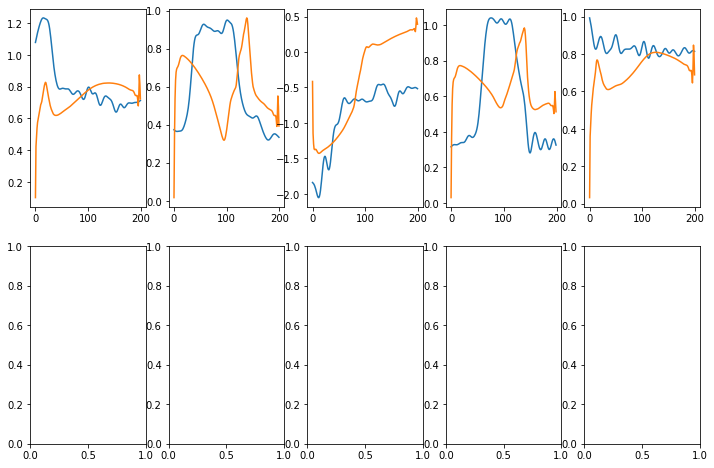

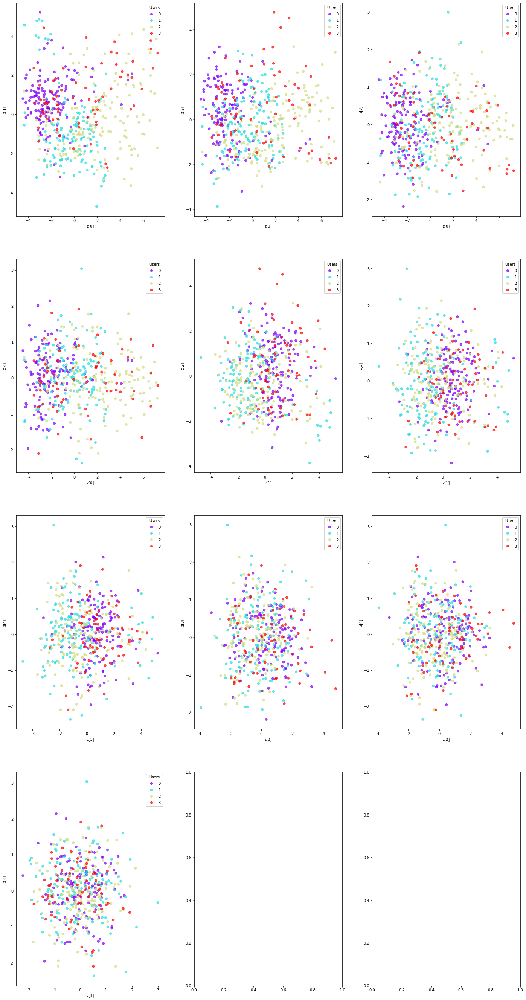

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


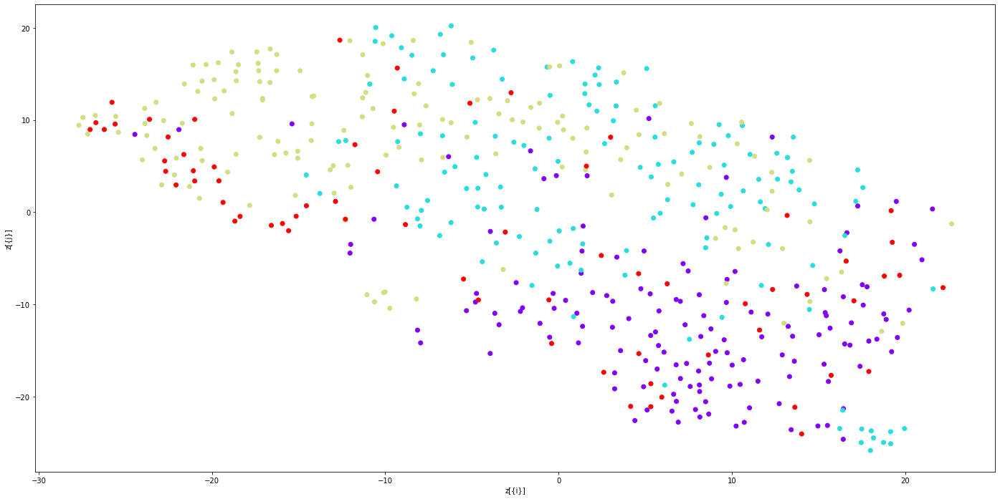

[100, 18] loss: 3.042 | reconstruction: 2.671 | kl: 371.186
[101, 18] loss: 3.056 | reconstruction: 2.686 | kl: 369.263
[102, 18] loss: 2.946 | reconstruction: 2.580 | kl: 366.747
[103, 18] loss: 2.934 | reconstruction: 2.569 | kl: 365.471
[104, 18] loss: 2.939 | reconstruction: 2.571 | kl: 368.210
[105, 18] loss: 3.002 | reconstruction: 2.638 | kl: 364.397
[106, 18] loss: 2.899 | reconstruction: 2.531 | kl: 367.884
[107, 18] loss: 2.898 | reconstruction: 2.527 | kl: 370.140
[108, 18] loss: 2.909 | reconstruction: 2.543 | kl: 366.661
[109, 18] loss: 2.937 | reconstruction: 2.573 | kl: 363.922
[110, 18] loss: 2.838 | reconstruction: 2.472 | kl: 365.856
[111, 18] loss: 3.007 | reconstruction: 2.641 | kl: 365.909
[112, 18] loss: 2.805 | reconstruction: 2.432 | kl: 372.956
[113, 18] loss: 2.905 | reconstruction: 2.544 | kl: 361.687
[114, 18] loss: 2.844 | reconstruction: 2.480 | kl: 364.314
[115, 18] loss: 2.809 | reconstruction: 2.450 | kl: 359.745
[116, 18] loss: 2.783 | reconstruction: 

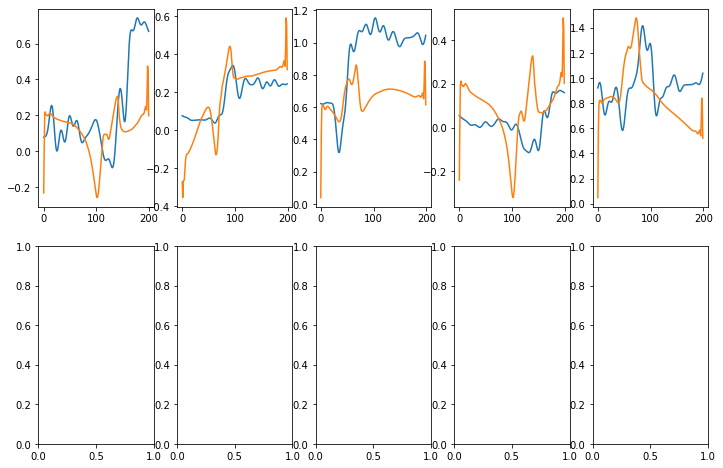

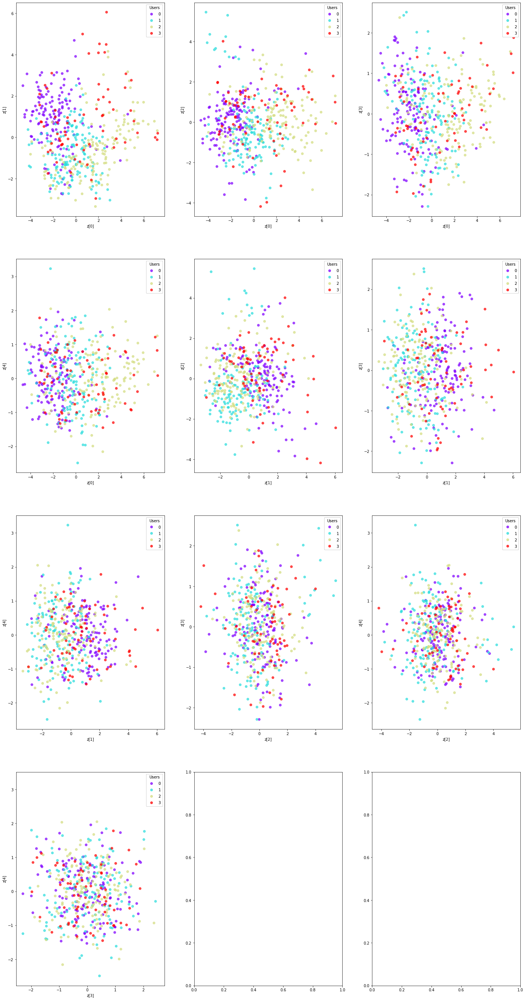

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


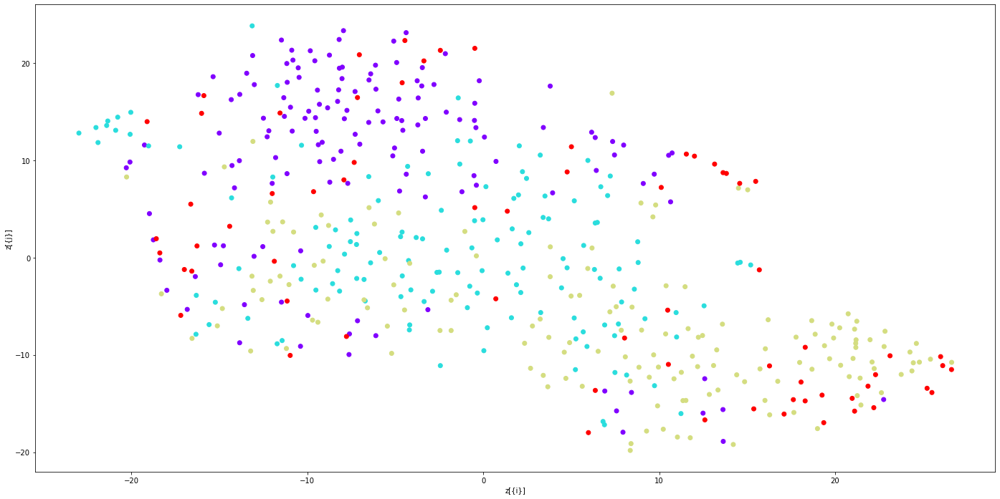

[200, 18] loss: 2.194 | reconstruction: 1.859 | kl: 335.167
[201, 18] loss: 2.226 | reconstruction: 1.885 | kl: 340.686
[202, 18] loss: 2.204 | reconstruction: 1.873 | kl: 330.847
[203, 18] loss: 2.218 | reconstruction: 1.881 | kl: 336.437
[204, 18] loss: 2.207 | reconstruction: 1.876 | kl: 331.740
[205, 18] loss: 2.176 | reconstruction: 1.844 | kl: 332.749
[206, 18] loss: 2.151 | reconstruction: 1.816 | kl: 335.351
[207, 18] loss: 2.198 | reconstruction: 1.861 | kl: 337.189
[208, 18] loss: 2.155 | reconstruction: 1.818 | kl: 336.805
[209, 18] loss: 2.170 | reconstruction: 1.844 | kl: 325.846
[210, 18] loss: 2.147 | reconstruction: 1.817 | kl: 330.182
[211, 18] loss: 2.147 | reconstruction: 1.818 | kl: 329.024
[212, 18] loss: 2.198 | reconstruction: 1.870 | kl: 327.973
[213, 18] loss: 2.133 | reconstruction: 1.801 | kl: 331.742
[214, 18] loss: 2.202 | reconstruction: 1.877 | kl: 325.155
[215, 18] loss: 2.177 | reconstruction: 1.845 | kl: 332.117
[216, 18] loss: 2.122 | reconstruction: 

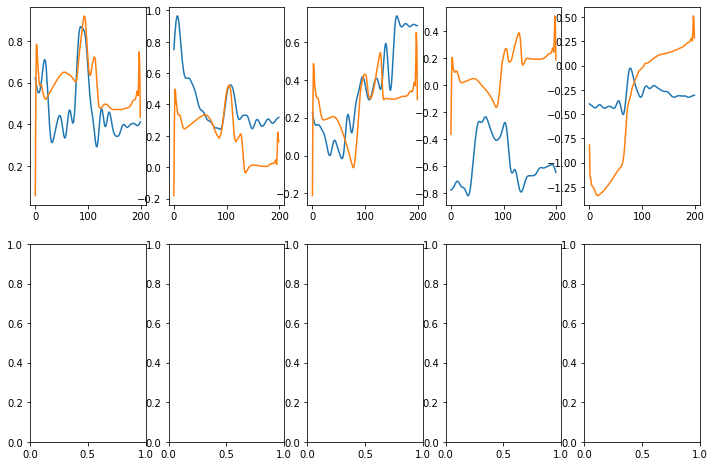

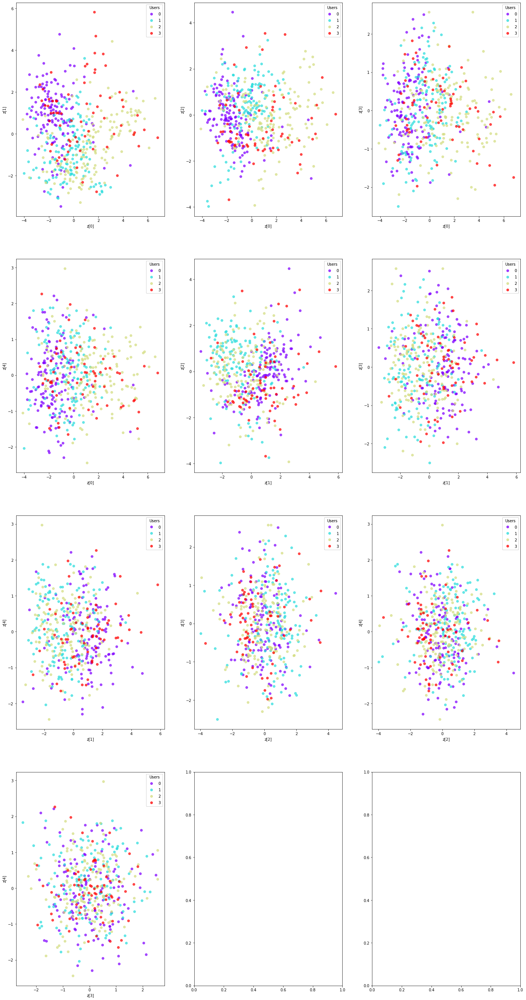

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


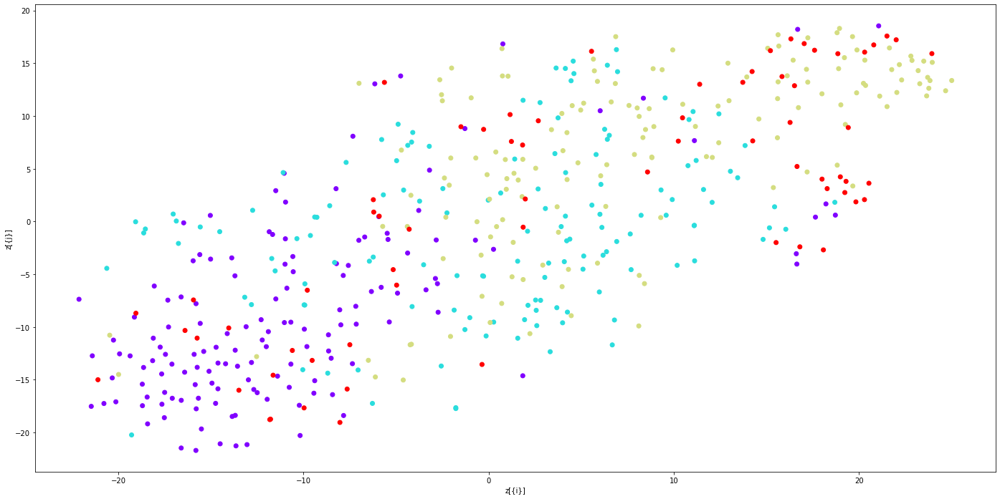

[300, 18] loss: 1.717 | reconstruction: 1.397 | kl: 320.144
[301, 18] loss: 1.709 | reconstruction: 1.387 | kl: 322.878
[302, 18] loss: 1.661 | reconstruction: 1.337 | kl: 323.655
[303, 18] loss: 1.653 | reconstruction: 1.331 | kl: 321.740
[304, 18] loss: 1.733 | reconstruction: 1.415 | kl: 318.253
[305, 18] loss: 1.686 | reconstruction: 1.362 | kl: 324.327
[306, 18] loss: 1.650 | reconstruction: 1.331 | kl: 319.387
[307, 18] loss: 1.723 | reconstruction: 1.399 | kl: 324.410
[308, 18] loss: 1.676 | reconstruction: 1.353 | kl: 322.244
[309, 18] loss: 1.656 | reconstruction: 1.332 | kl: 324.222
[310, 18] loss: 1.646 | reconstruction: 1.325 | kl: 320.459
[311, 18] loss: 1.651 | reconstruction: 1.328 | kl: 322.403
[312, 18] loss: 1.656 | reconstruction: 1.335 | kl: 320.675
[313, 18] loss: 1.620 | reconstruction: 1.302 | kl: 318.239
[314, 18] loss: 1.660 | reconstruction: 1.337 | kl: 322.735
[315, 18] loss: 1.667 | reconstruction: 1.345 | kl: 321.679
[316, 18] loss: 1.561 | reconstruction: 

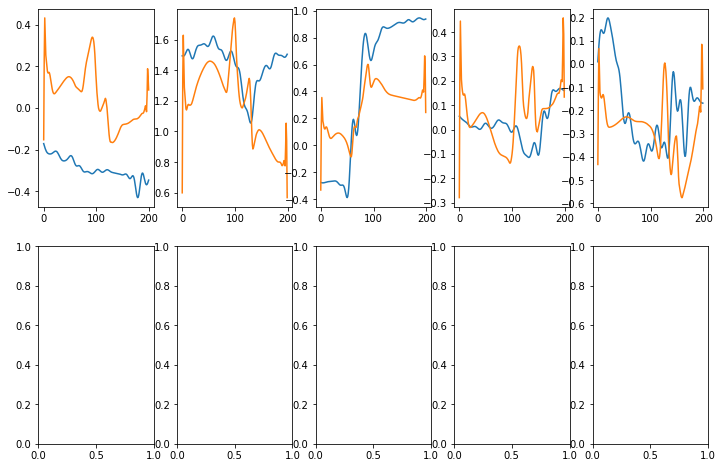

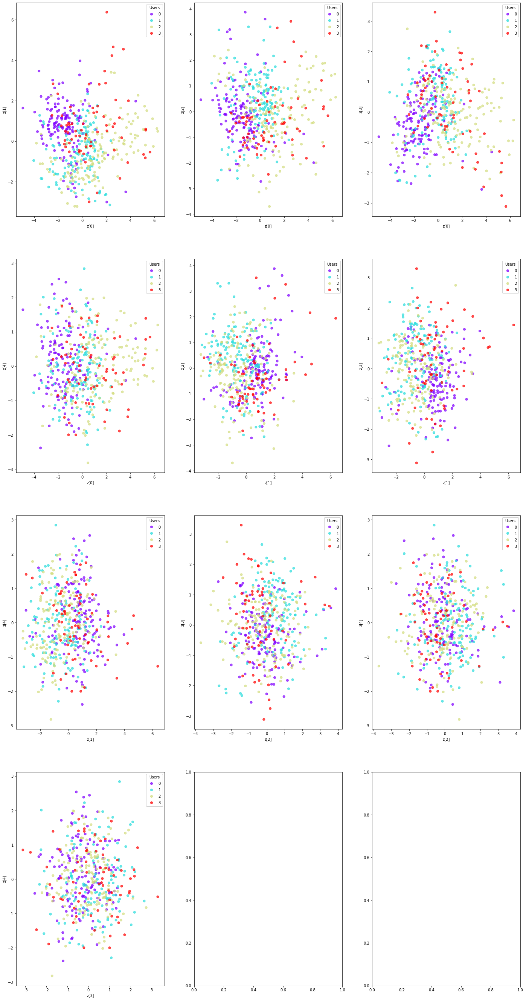

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


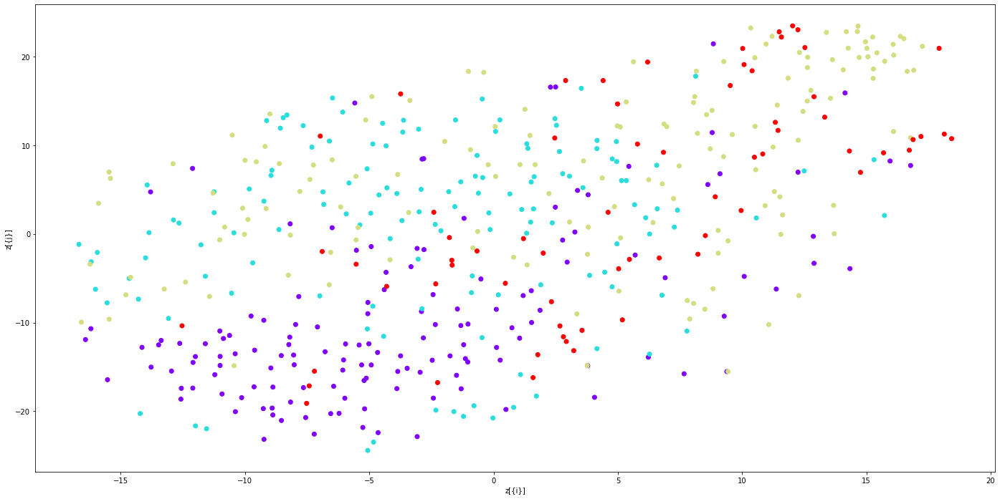

[400, 18] loss: 1.263 | reconstruction: 0.937 | kl: 326.139
[401, 18] loss: 1.222 | reconstruction: 0.896 | kl: 325.834
[402, 18] loss: 1.232 | reconstruction: 0.914 | kl: 318.050
[403, 18] loss: 1.226 | reconstruction: 0.908 | kl: 318.106
[404, 18] loss: 1.241 | reconstruction: 0.920 | kl: 321.017
[405, 18] loss: 1.218 | reconstruction: 0.895 | kl: 323.678
[406, 18] loss: 1.201 | reconstruction: 0.876 | kl: 324.620
[407, 18] loss: 1.189 | reconstruction: 0.868 | kl: 320.591
[408, 18] loss: 1.170 | reconstruction: 0.844 | kl: 325.644
[409, 18] loss: 1.179 | reconstruction: 0.858 | kl: 320.841
[410, 18] loss: 1.204 | reconstruction: 0.884 | kl: 319.936
[411, 18] loss: 1.169 | reconstruction: 0.852 | kl: 316.884
[412, 18] loss: 1.210 | reconstruction: 0.888 | kl: 321.842
[413, 18] loss: 1.167 | reconstruction: 0.845 | kl: 322.500
[414, 18] loss: 1.202 | reconstruction: 0.882 | kl: 320.307
[415, 18] loss: 1.144 | reconstruction: 0.824 | kl: 320.605
[416, 18] loss: 1.186 | reconstruction: 

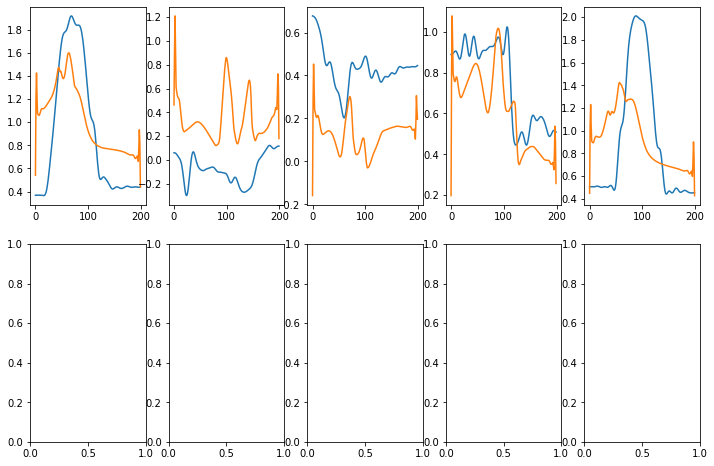

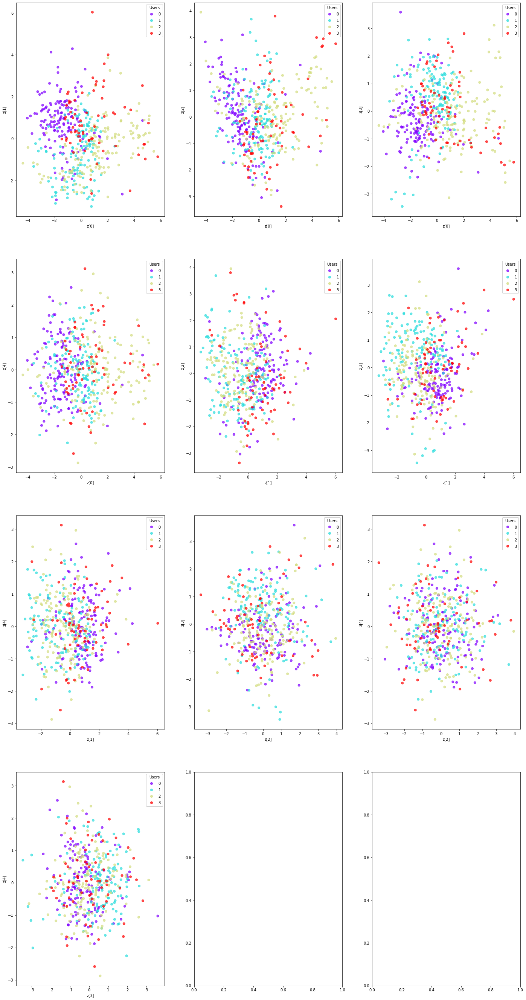

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


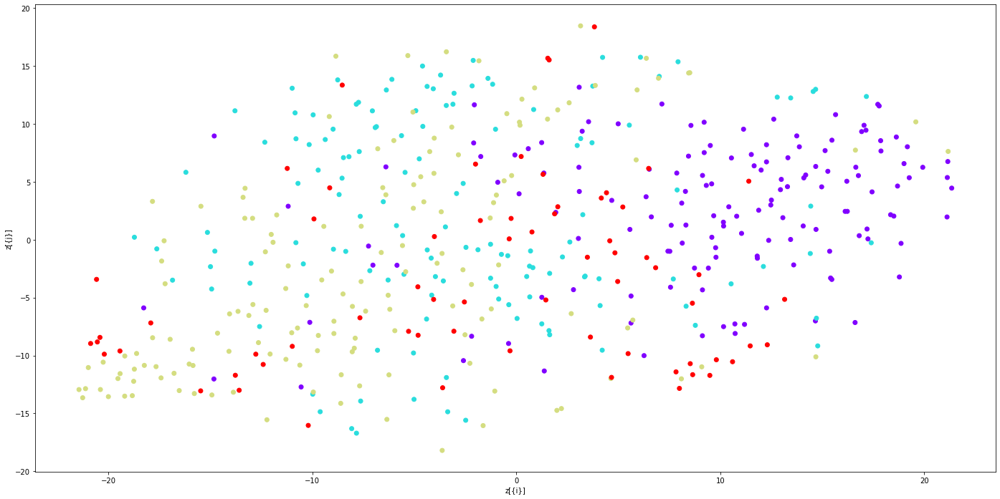

[500, 18] loss: 0.996 | reconstruction: 0.676 | kl: 319.561
[501, 18] loss: 0.977 | reconstruction: 0.661 | kl: 316.289
[502, 18] loss: 0.972 | reconstruction: 0.662 | kl: 309.995
[503, 18] loss: 0.897 | reconstruction: 0.585 | kl: 311.619
[504, 18] loss: 0.952 | reconstruction: 0.635 | kl: 316.818
[505, 18] loss: 0.934 | reconstruction: 0.618 | kl: 315.594
[506, 18] loss: 0.926 | reconstruction: 0.609 | kl: 316.232
[507, 18] loss: 0.977 | reconstruction: 0.661 | kl: 315.731
[508, 18] loss: 0.880 | reconstruction: 0.565 | kl: 315.439
[509, 18] loss: 0.946 | reconstruction: 0.637 | kl: 309.446
[510, 18] loss: 0.949 | reconstruction: 0.637 | kl: 312.298
[511, 18] loss: 0.932 | reconstruction: 0.620 | kl: 311.350
[512, 18] loss: 0.922 | reconstruction: 0.614 | kl: 307.615
[513, 18] loss: 0.964 | reconstruction: 0.653 | kl: 310.412
[514, 18] loss: 0.955 | reconstruction: 0.644 | kl: 310.730
[515, 18] loss: 0.958 | reconstruction: 0.647 | kl: 310.876
[516, 18] loss: 0.996 | reconstruction: 

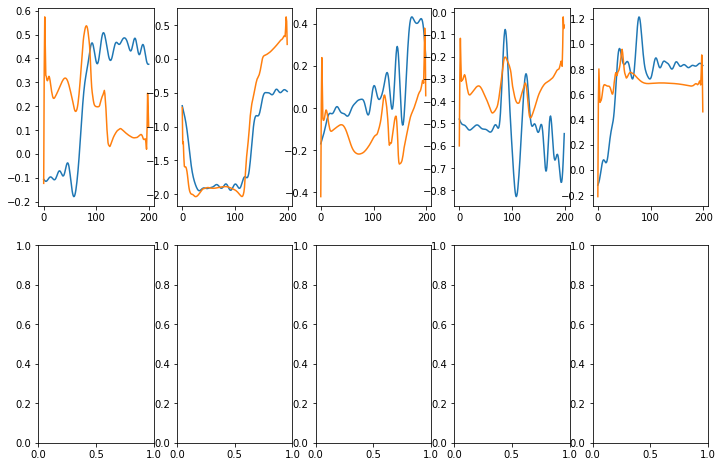

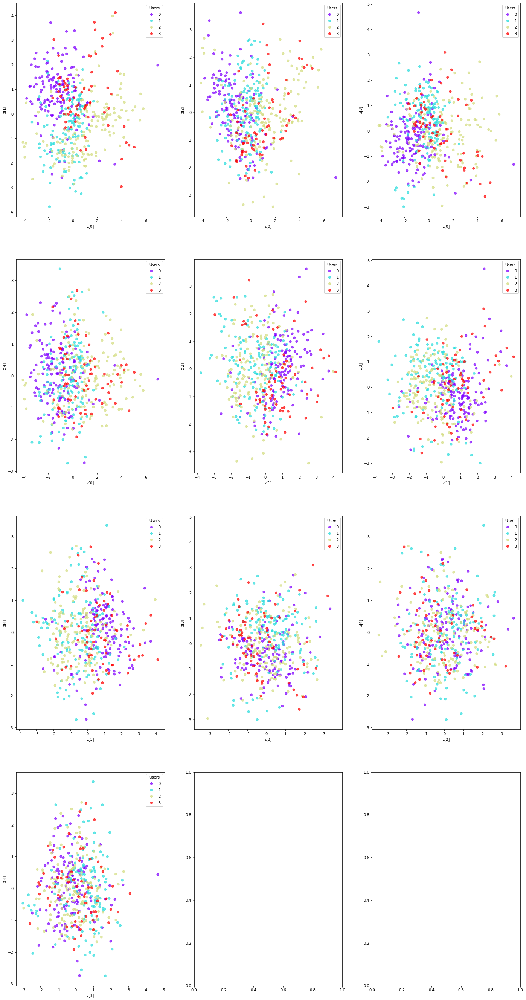

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


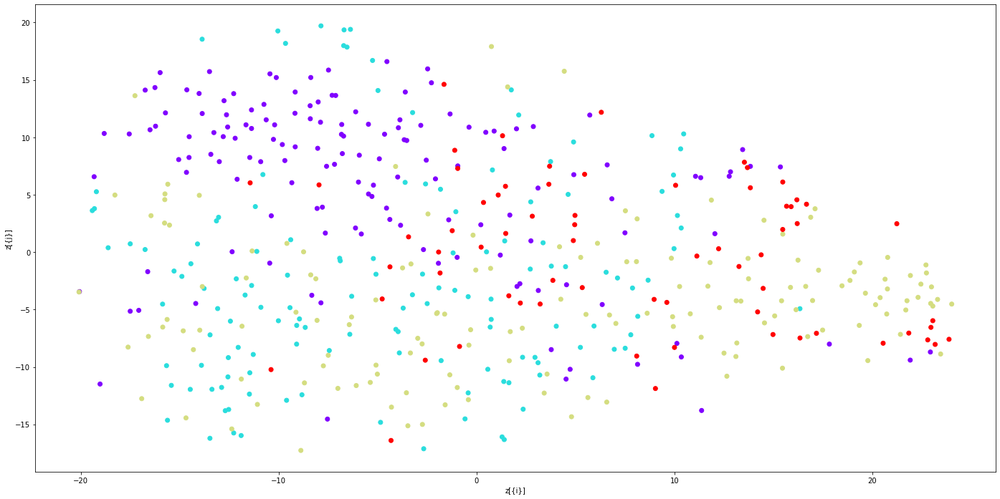

[600, 18] loss: 0.741 | reconstruction: 0.436 | kl: 305.383
[601, 18] loss: 0.760 | reconstruction: 0.455 | kl: 304.316
[602, 18] loss: 0.753 | reconstruction: 0.449 | kl: 304.755
[603, 18] loss: 0.725 | reconstruction: 0.421 | kl: 303.730
[604, 18] loss: 0.748 | reconstruction: 0.445 | kl: 302.884
[605, 18] loss: 0.781 | reconstruction: 0.477 | kl: 304.716
[606, 18] loss: 0.743 | reconstruction: 0.445 | kl: 297.909
[607, 18] loss: 0.771 | reconstruction: 0.469 | kl: 302.713
[608, 18] loss: 0.767 | reconstruction: 0.463 | kl: 304.280
[609, 18] loss: 0.742 | reconstruction: 0.434 | kl: 308.082
[610, 18] loss: 0.762 | reconstruction: 0.458 | kl: 304.066
[611, 18] loss: 0.750 | reconstruction: 0.446 | kl: 303.275
[612, 18] loss: 0.737 | reconstruction: 0.433 | kl: 304.035
[613, 18] loss: 0.715 | reconstruction: 0.416 | kl: 298.623
[614, 18] loss: 0.734 | reconstruction: 0.432 | kl: 301.983
[615, 18] loss: 0.790 | reconstruction: 0.491 | kl: 299.138
[616, 18] loss: 0.724 | reconstruction: 

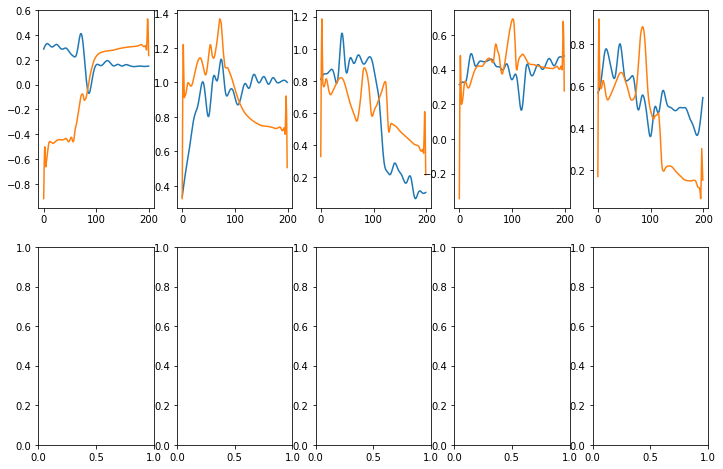

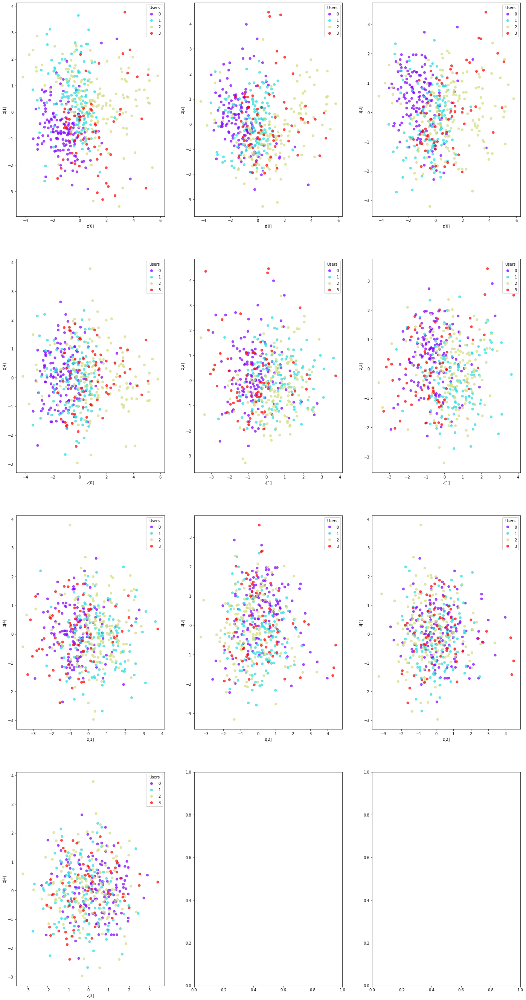

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


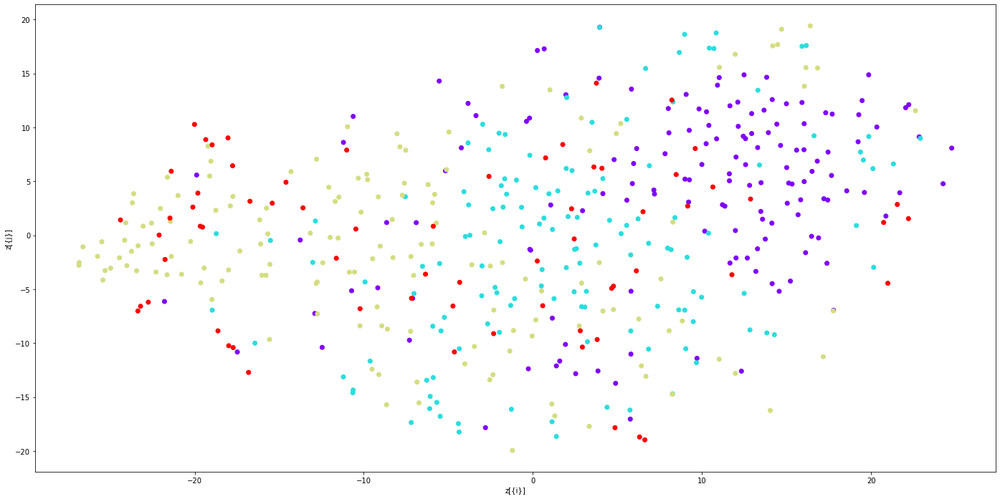

[700, 18] loss: 0.602 | reconstruction: 0.309 | kl: 293.732
[701, 18] loss: 0.594 | reconstruction: 0.298 | kl: 296.339
[702, 18] loss: 0.620 | reconstruction: 0.323 | kl: 296.387
[703, 18] loss: 0.630 | reconstruction: 0.333 | kl: 297.073
[704, 18] loss: 0.585 | reconstruction: 0.289 | kl: 296.161
[705, 18] loss: 0.590 | reconstruction: 0.294 | kl: 296.102
[706, 18] loss: 0.616 | reconstruction: 0.318 | kl: 297.787
[707, 18] loss: 0.614 | reconstruction: 0.314 | kl: 300.189
[708, 18] loss: 0.594 | reconstruction: 0.297 | kl: 297.056
[709, 18] loss: 0.602 | reconstruction: 0.304 | kl: 298.640
[710, 18] loss: 0.589 | reconstruction: 0.288 | kl: 301.207
[711, 18] loss: 0.624 | reconstruction: 0.323 | kl: 300.400
[712, 18] loss: 0.559 | reconstruction: 0.261 | kl: 297.472
[713, 18] loss: 0.593 | reconstruction: 0.295 | kl: 298.030
[714, 18] loss: 0.565 | reconstruction: 0.267 | kl: 298.906
[715, 18] loss: 0.620 | reconstruction: 0.321 | kl: 298.547
[716, 18] loss: 0.596 | reconstruction: 

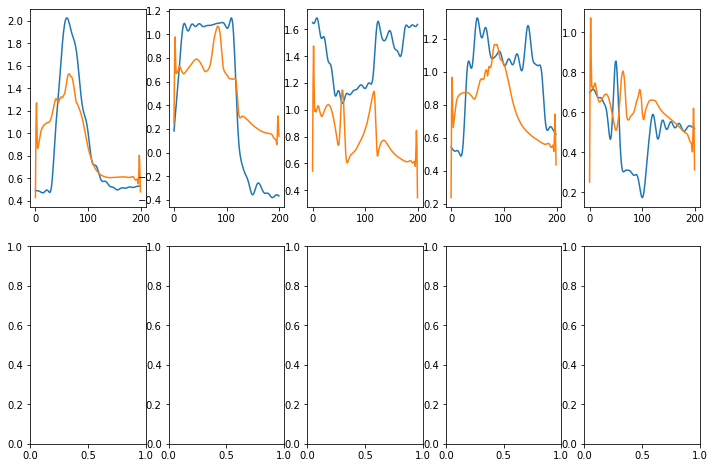

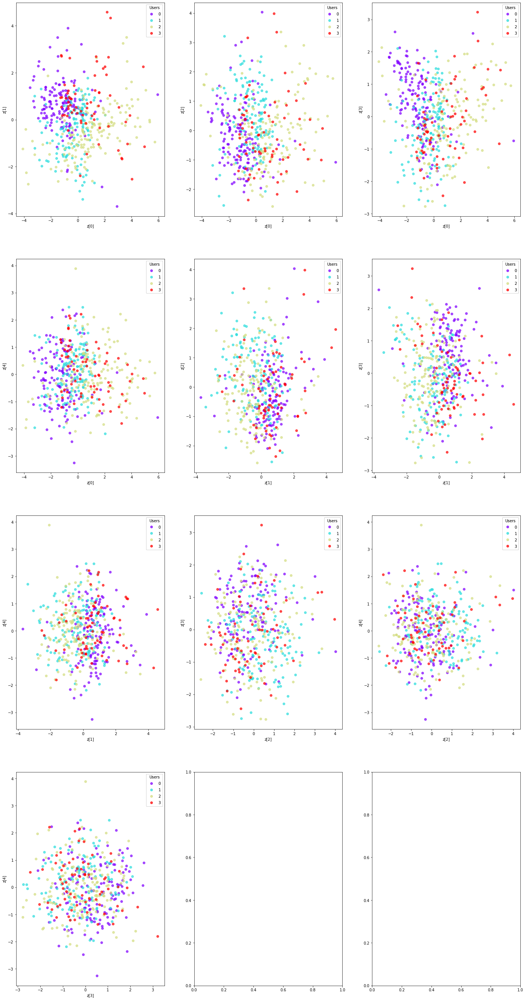

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


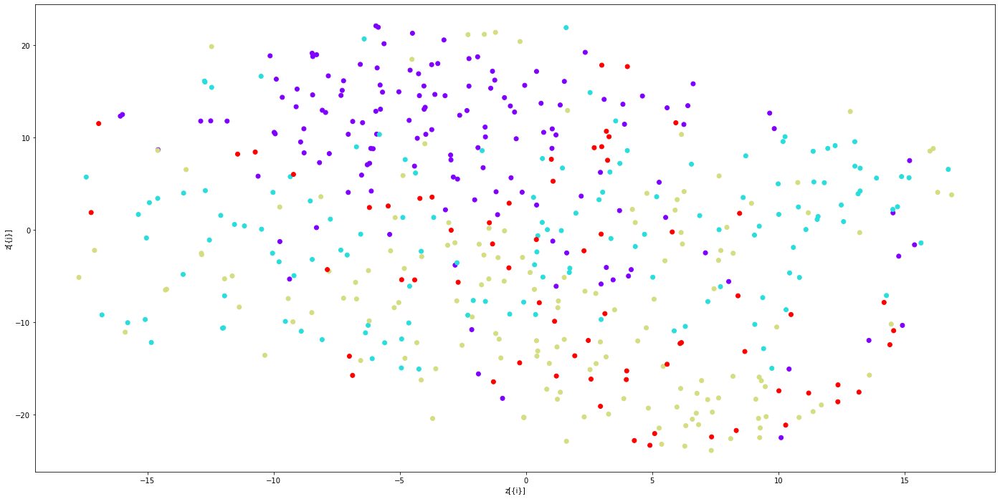

[800, 18] loss: 0.439 | reconstruction: 0.144 | kl: 294.893
[801, 18] loss: 0.496 | reconstruction: 0.200 | kl: 296.139
[802, 18] loss: 0.472 | reconstruction: 0.180 | kl: 292.706
[803, 18] loss: 0.470 | reconstruction: 0.178 | kl: 292.519
[804, 18] loss: 0.451 | reconstruction: 0.161 | kl: 290.463
[805, 18] loss: 0.482 | reconstruction: 0.191 | kl: 290.575
[806, 18] loss: 0.464 | reconstruction: 0.172 | kl: 292.727
[807, 18] loss: 0.456 | reconstruction: 0.165 | kl: 291.025
[808, 18] loss: 0.413 | reconstruction: 0.122 | kl: 291.120
[809, 18] loss: 0.420 | reconstruction: 0.131 | kl: 289.358
[810, 18] loss: 0.486 | reconstruction: 0.198 | kl: 287.995
[811, 18] loss: 0.442 | reconstruction: 0.151 | kl: 290.165
[812, 18] loss: 0.484 | reconstruction: 0.193 | kl: 290.936
[813, 18] loss: 0.465 | reconstruction: 0.175 | kl: 290.121
[814, 18] loss: 0.504 | reconstruction: 0.209 | kl: 294.856
[815, 18] loss: 0.491 | reconstruction: 0.200 | kl: 290.780
[816, 18] loss: 0.497 | reconstruction: 

In [ ]:

beta = 1e-3


for epoch in range(2000):  # loop over the dataset multiple times

    running_recon_loss = 0.0
    running_kl_loss =  0.0
    for i, data in enumerate(train_dataloader, 0):
        optimizer.zero_grad()
        
        data = data.to(device)

        z_mean, z_log_var, z = vae.encoder(data)
        reconstruction = vae.decoder(z)
        
        transposed_data = torch.transpose(data, 1, 2)
        transposed_reconstruction = torch.transpose(reconstruction, 1, 2)
        
        reconstruction_loss = 0
        for channel in range(6):
            reconstruction_loss += sdtw(transposed_data[:,:,channel:channel+1], transposed_reconstruction[:,:,channel:channel+1]) / 1200
        #reconstruction_loss = torch.nn.MSELoss()(data, reconstruction)
        reconstruction_loss = torch.mean(reconstruction_loss)
        
        kl_loss = -0.5 * (1 + z_log_var - torch.square(z_mean) - torch.exp(z_log_var))
        kl_loss = torch.mean(torch.sum(kl_loss, axis=1))
        #kl_loss = torch.Tensor([0]).to(device)
        loss = reconstruction_loss + beta * kl_loss
        
        loss.backward()
        optimizer.step()

        # print statistics
        running_recon_loss += reconstruction_loss.item()
        running_kl_loss += kl_loss.item()
        
    if epoch % 100 == 99:
        data = torch.Tensor(train_dataset[:500]).to(device)
        latent = vae.encoder(data)[2]
        reconstruction = vae.decoder(latent)


        plot_reconstructed_curves(data.cpu(),reconstruction.detach().cpu(), channel=0)
        plot_label_clusters(latent.detach().cpu(), labels_train[:500])
        visualise(latent.detach().cpu(), labels_train[:500])

    print(f'[{epoch + 1}, {i + 1}] loss: %.3f | reconstruction: %.3f | kl: %.3f' %
          (beta * running_kl_loss + running_recon_loss, running_recon_loss, running_kl_loss))

print('Finished Training')

vae.save_model("all_users", "soft_dtw_ls=20_beta=1e-3")

In [ ]:
vae.save_model("all_users", "soft_dtw_ls20")

tensor([[-1.2855, -1.5228, -0.8264,  ..., -1.5848, -0.5567, -1.4099],
        [-2.7717, -2.3008, -3.1445,  ..., -3.4173, -2.8583, -3.9030],
        [-2.2227, -2.3647, -3.1638,  ..., -2.7275, -2.2035, -3.8518],
        ...,
        [-2.1508, -2.5139, -2.1441,  ..., -2.4100, -1.7639, -2.7027],
        [-5.2395, -4.1150, -7.5008,  ..., -7.0543, -6.5648, -8.9425],
        [-6.3666, -6.1114, -3.6614,  ..., -7.4982, -4.6050, -8.4008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

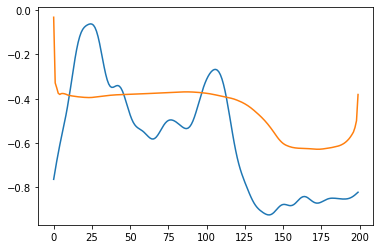

In [162]:
chan = 0
ix = 0


display(z_log_var)

plt.plot(data.detach().cpu()[ix,chan,:])
plt.plot(reconstruction.detach().cpu()[ix,chan,:])

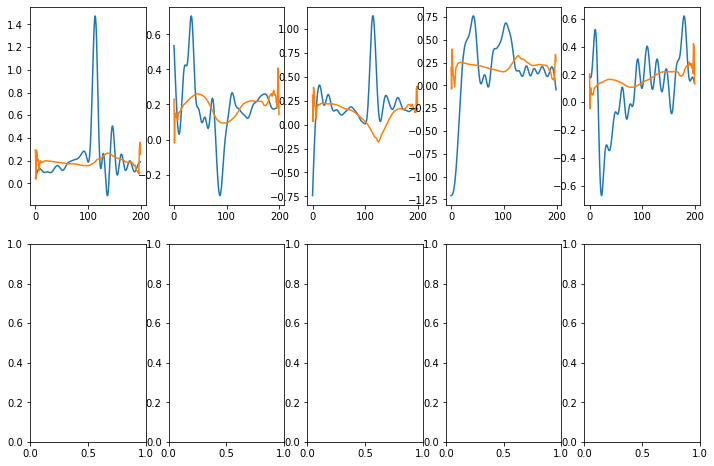

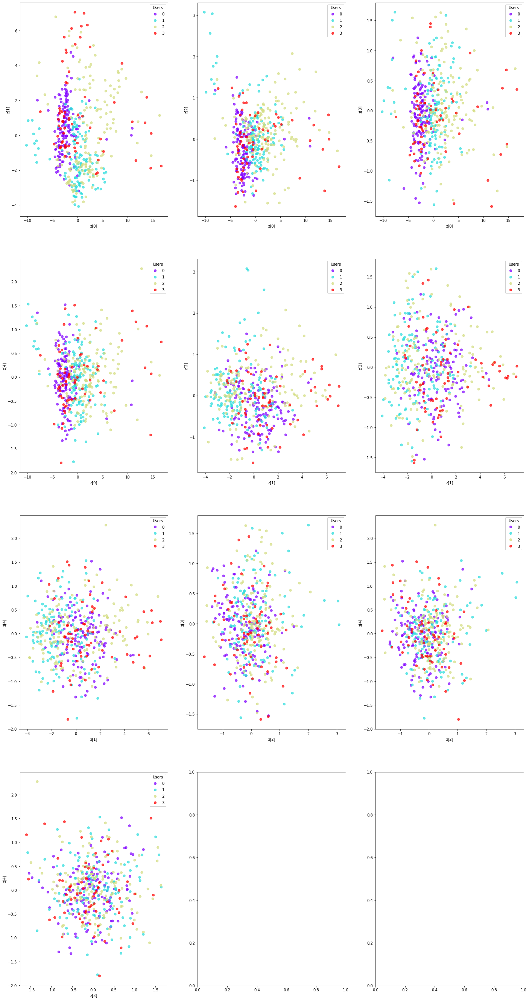

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


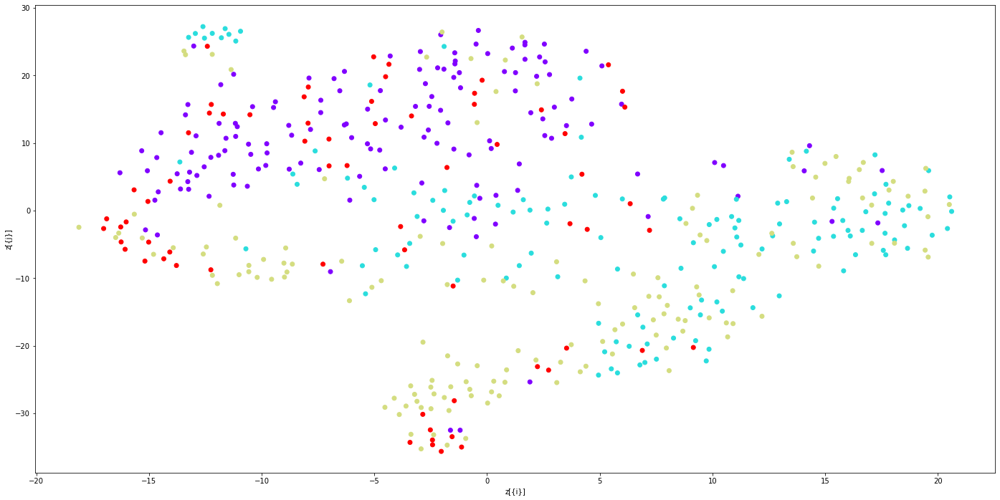

In [12]:


def dimension_reduction(z_pca, labels) -> pd.DataFrame:

    visualisation = TSNE(n_components=2).fit_transform(z_pca)
    df = pd.DataFrame(visualisation, columns = ["dimension 1", "dimension 2"])  #, "dimension 3"
    df["labels"] = labels
    return df


def plot_label_clusters(z_mean, labels, pca=None):
    # display a 2D plot of the user classes in the latent space
    if pca is None:
        pca = PCA()
        z_pca = pca.fit_transform(z_mean)
        #z_pca = z_mean
    else:
        z_pca = pca.transform(z_mean)
    
    comps = 5

    pair_set = [(i,j) for i in range(comps) for j in range(i+1,comps)]
    
    fig, ax = plt.subplots(1 + len(pair_set)//3,3, figsize=(24,48))
    
    for ix, (i,j) in enumerate(pair_set):
        scatter = ax[divmod(ix, 3)].scatter(z_pca[:, i], z_pca[:, j], c=labels, alpha=0.7, cmap = "rainbow")
        ax[divmod(ix, 3)].set_xlabel(f"z[{i}]")
        ax[divmod(ix, 3)].set_ylabel(f"z[{j}]")
        legend = ax[divmod(ix, 3)].legend(*scatter.legend_elements(),
                    loc="upper right", title="Users")
        ax[divmod(ix, 3)].add_artist(legend)
    #plt.colorbar()
    
    plt.show()

def visualise(z_mean, labels, latent_dim=20, pca=None):
    # display a 2D plot of the user classes in the latent space
    if pca is None:
        pca = PCA(min(latent_dim, 20))
        z_pca = pca.fit_transform(z_mean)
        #z_pca = z_mean
    else:
        z_pca = pca.transform(z_mean)
    
    df = dimension_reduction(z_pca, labels)

    fig, ax = plt.subplots(1,1, figsize=(24,12) ) # , subplot_kw={"projection": "3d"})# , 
                           
    ax.scatter(df["dimension 1"], df["dimension 2"],  c = df["labels"], cmap = "rainbow") #  df["dimension 3"],
    ax.set_xlabel("z[{i}]")
    ax.set_ylabel("z[{j}]")
    #plt.colorbar()
    
    plt.show()


def plot_reconstructed_curves(data, reconstruction, channel=0):
    fig,ax = plt.subplots(2,5, figsize=(12,8))
    j = 0

    for i in random.sample(range(0, len(data)), 5):
        ax[divmod(j,5)].plot(data[i,channel, :])
        ax[divmod(j,5)].plot(reconstruction[i,channel,:])

        j += 1

    plt.show()


data = torch.Tensor(train_dataset[:500]).to(device)
latent = vae.encoder(data)[2]
reconstruction = vae.decoder(latent)


plot_reconstructed_curves(data.cpu(),reconstruction.detach().cpu(), channel=5)
plot_label_clusters(latent.detach().cpu(), labels_train[:500])
visualise(latent.detach().cpu(), labels_train[:500])

In [ ]:
#embedding_model = EmbeddingModel(2)
#embedding_model.compile(Adam())

#embedding_model.fit(data_train[train_map],labels_train[train_map],
#                    validation_data = (data_train[val_map],labels_train[val_map]),
#                    epochs=100, batch_size=128)
"""
gesture_model = get_new_auth_model((200,6), 10, "softmax")

gesture_model.compile(Adam(), loss="sigmoid")

gesture_model.fit(data_train[train_map],labels_train[train_map],
                   validation_data = (data_train[val_map],labels_train[val_map]),
                  epochs=100, batch_size=128)
   """
user_model = get_new_auth_model((200,6), 1, "sigmoid")

user_model.compile(Adam(), loss="binary_crossentropy")

user_model.fit(data_train[train_map],labels_train[train_map],
                   validation_data = (data_train[val_map],labels_train[val_map]),
                  epochs=20, batch_size=128)

In [75]:
def evaluate(labels_pred, labels_scores, labels_test):
    fmeasure = f1_score(labels_test, labels_pred, average = "binary", labels = np.unique(labels_pred)) # macro vs binary
    auroc = sklearn.metrics.roc_auc_score(labels_test, labels_scores, average = "macro", labels = np.unique(labels_pred))


    scores_legit = [labels_scores[i] for i in range(len(labels_test)) if 1 == labels_test[i]]
    scores_adv = [labels_scores[i] for i in range(len(labels_test)) if 0 == labels_test[i]]
    eer_theta, eer = get_eer(scores_legit, scores_adv)
    far_theta, far = get_far_when_zero_frr(scores_legit, scores_adv)

    print(f"fmeasure {fmeasure} | auroc {auroc} | eer {eer} | far {far}" )

intent_model = user_model

labels_scores = intent_model.predict(data_test)
labels_pred = labels_scores >= 0.5

evaluate(labels_pred, labels_scores, labels_test)

566/566 [==============================] - 4s 7ms/step
fmeasure 0.7124087591240875 | auroc 0.9872636456689692 | eer 0.05625750385912753 | far 0.31381853524669834


In [76]:
model = RandomForestClassifier(n_estimators = 100, random_state = 0, class_weight="balanced").fit(feature_data_train, labels_train)
labels_pred = model.predict(feature_data_test)
labels_scores = model.predict_proba(feature_data_test)[:, 1]
            
fmeasure = f1_score(labels_test, labels_pred, average = "binary", labels = np.unique(labels_pred)) # macro vs binary
auroc = sklearn.metrics.roc_auc_score(labels_test, labels_scores, average = "macro", labels = np.unique(labels_pred))


scores_legit = [labels_scores[i] for i in range(len(labels_test)) if 1 == labels_test[i]]
scores_adv = [labels_scores[i] for i in range(len(labels_test)) if 0 == labels_test[i]]
eer_theta, eer = get_eer(scores_legit, scores_adv)
far_theta, far = get_far_when_zero_frr(scores_legit, scores_adv)

print(f"fmeasure {fmeasure} | auroc {auroc} | eer {eer} | far {far}" )

fmeasure 0.8472095150960659 | auroc 0.992257511985134 | eer 0.02418386598822253 | far 0.36807501000514553


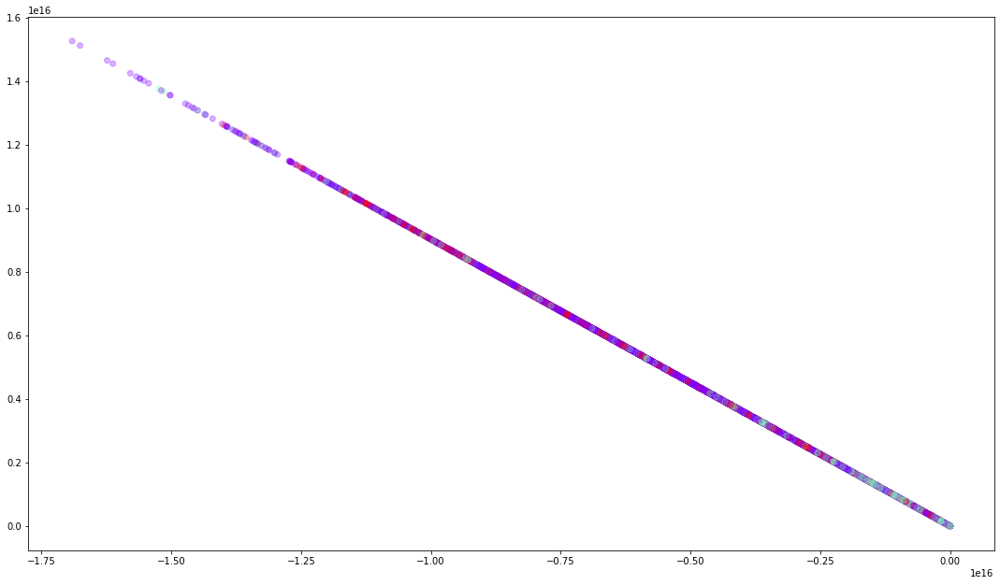

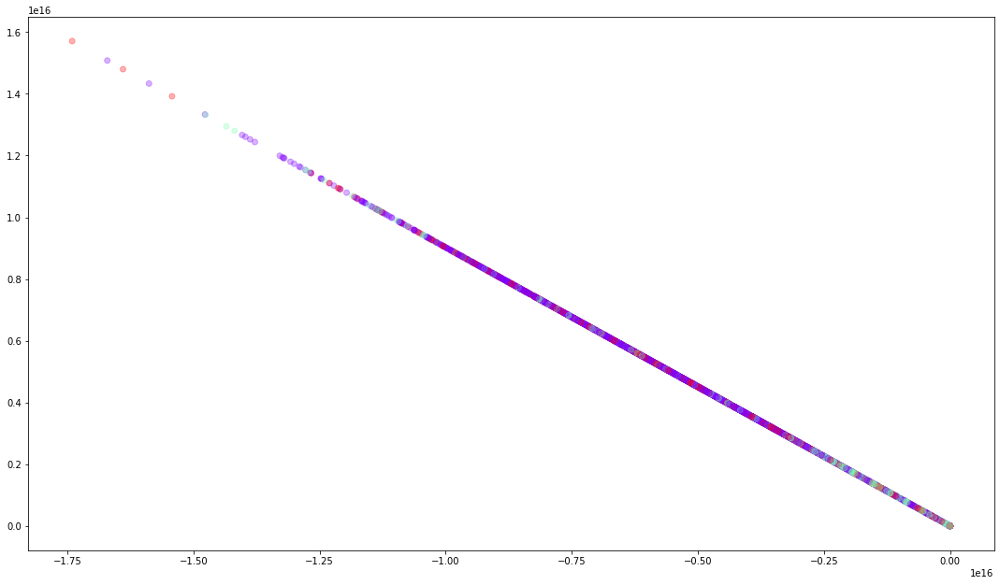

In [19]:
train_embeddings = embedding_model.embedding(data_train[train_map])
val_embeddings = embedding_model.embedding(data_train[val_map])


fig = plt.figure()
ax = fig.add_subplot() #projection='3d') # embs[:, 2],

ax.scatter(train_embeddings[:,0], train_embeddings[:,1], cmap="rainbow", c = labels_train[train_map].argmax(axis=1), alpha=0.3)
fig.set_size_inches(18.5, 10.5)

fig = plt.figure()
ax = fig.add_subplot() # projection='3d') # embs[:, 2],

ax.scatter(val_embeddings[:,0], val_embeddings[:,1],  cmap="rainbow", c = labels_train[val_map].argmax(axis=1), alpha= 0.3)

fig.set_size_inches(18.5, 10.5)
plt.show()

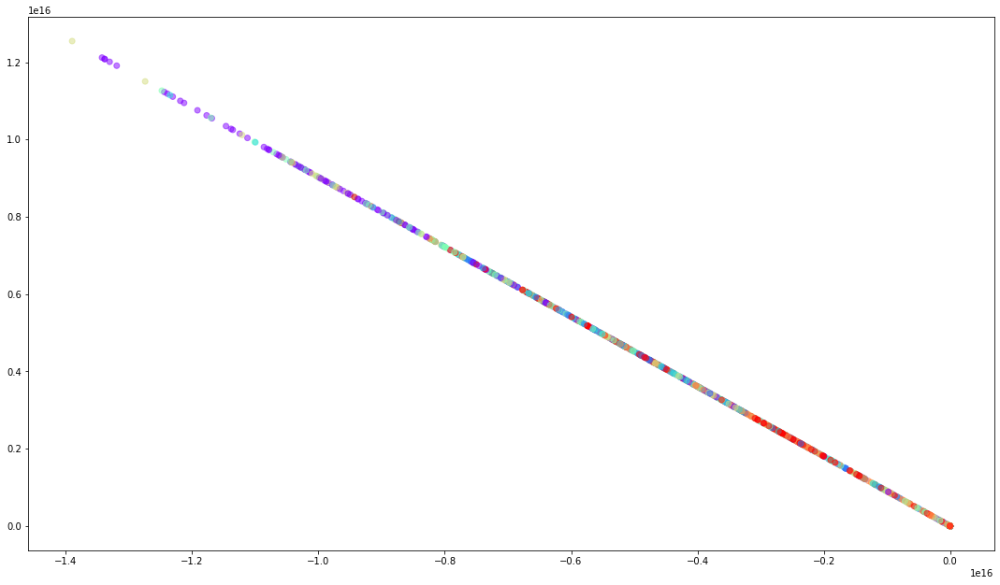

In [20]:
test_embeddings = embedding_model.embedding(data_test)


fig = plt.figure()
ax = fig.add_subplot() # projection='3d') # embs[:, 2],

ax.scatter(test_embeddings[:,0], test_embeddings[:,1],  cmap="rainbow", c = labels_test.argmax(axis=1), alpha=0.5)

fig.set_size_inches(18.5, 10.5)
plt.show()

In [97]:
new_vae = cVAE_features(10, feature_data_train.shape[1], 3)
new_vae.compile(Adam())
new_vae.fit(feature_data_train[train_map], train_embeddings,
            epochs=500, batch_size=128,
            validation_data=(feature_data_train[val_map], val_embeddings))

NameError: name 'feature_data_train' is not defined

tf.Tensor(
[[-0.17557123 -1.7420337  -0.20630853 ... -0.4075591   0.6376725
   0.07492887]
 [ 1.0621558   0.7528581  -0.8369732  ...  1.1456081   2.7858794
   1.1045278 ]
 [ 0.43703994  0.20817971 -1.0336369  ...  0.44192412  2.3452709
   1.1402023 ]
 ...
 [-0.38430798  0.30692646  1.4001826  ...  0.9414367   0.9039803
  -0.23173845]
 [-0.21485437  0.7433752   0.33132505 ...  0.6025061  -0.6940012
  -0.5845133 ]
 [-0.0328111  -0.9207284   0.00365493 ... -0.8795131   1.3138345
   0.8502835 ]], shape=(1799, 10), dtype=float32)


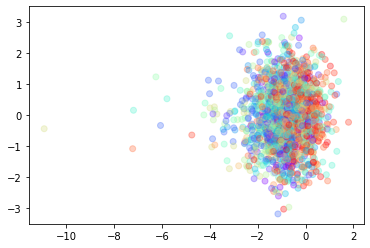

In [22]:
new_vae_embs_train = new_vae.encoder(tf.concat([feature_data_train[train_map], train_embeddings], 1))[2]
print(new_vae_embs_train)

fig = plt.figure()
ax = fig.add_subplot() # projection='3d') # embs[:, 2],

ax.scatter(new_vae_embs_train[:,0], new_vae_embs_train[:,1],  cmap="rainbow", c = labels_train[train_map].argmax(axis=1), alpha=0.3 )


(1799, 13)


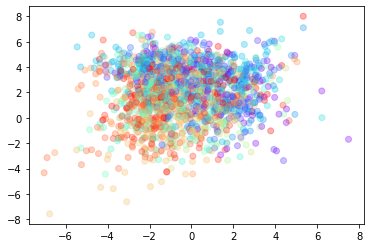

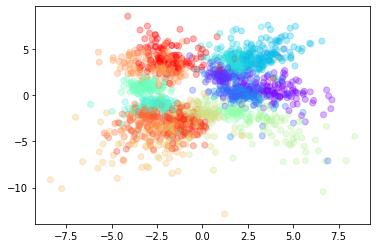

In [25]:
#user_map = y_user[train_gesture_map==1].argmax(axis=1) == 0

new_data_embeddings = tf.concat([tf.keras.backend.random_normal(shape=(len(train_embeddings), new_vae.latent_dim)), train_embeddings], 1)

print(new_data_embeddings.shape)
new_data = new_vae.decoder(new_data_embeddings)

new_embs = embedding_model.embedding(new_data)

fig = plt.figure()
ax = fig.add_subplot() # projection='3d') # embs[:, 2],

ax.scatter(new_embs[:,0], new_embs[:,1] ,  cmap="rainbow", c = labels_train[train_map].argmax(axis=1), alpha=0.3 )
plt.show()

fig = plt.figure()
ax = fig.add_subplot() # projection='3d') # embs[:, 2],

ax.scatter(train_embeddings[:,0], train_embeddings[:,1],  cmap="rainbow", c = labels_train[train_map].argmax(axis=1), alpha=0.3 )
plt.show()

## Running tests on all users

In [44]:
def get_eer(scores_legit, scores_adv):
    scores_legit = sorted(scores_legit)
    scores_adv = sorted(scores_adv)

    #treat each legitimate sample distance as a possible threshold, determine the point where FRR crosses FAR
    for c, threshold in enumerate(scores_legit):
        frr = c * 1.0 / len(scores_legit)
        adv_index = next((x[0] for x in enumerate(scores_adv) if x[1] > threshold), len(scores_adv))
        far = 1 - (adv_index * 1.0 / len(scores_adv))
        if frr >= far:
            return threshold, far
    print("Failure")

def get_eer_recogblind(scores_legit, scores_adv_typed, total_w, total_b, total_i):
	scores_legit = sorted(scores_legit)
	scores_adv_typed = sorted(scores_adv_typed, key = lambda x:x[0])
	
	#treat each legitimate sample distance as a possible threshold, determine the point where FRR crosses FAR
	for c, threshold in enumerate(scores_legit):
		frr = c * 1.0 / len(scores_legit)
		adv_index = next((x[0] for x in enumerate(scores_adv_typed) if x[1][0] > threshold), len(scores_adv_typed))
		far = 1 - (adv_index * 1.0 / len(scores_adv))
		if frr >= far:
			rejectrate_w = 0 if 0 == total_w else len([i for i in scores_adv_typed if 'W' == i[1] and i[0] >= threshold]) / total_w
			rejectrate_b = 0 if 0 == total_b else len([i for i in scores_adv_typed if 'B' == i[1] and i[0] >= threshold]) / total_b
			rejectrate_i = 0 if 0 == total_i else len([i for i in scores_adv_typed if 'I' == i[1] and i[0] >= threshold]) / total_i
			return threshold, far, rejectrate_w, rejectrate_b, rejectrate_i

def get_far_when_zero_frr(scores_legit, scores_adv):
    scores_legit = sorted(scores_legit)
    scores_adv = sorted(scores_adv)
	
	#treat each legitimate sample distance as a possible threshold, determine the point with the lowest FAR that satisfies the condition that FRR = 0
    for c, threshold in enumerate(scores_legit):

        frr = c * 1.0 / len(scores_legit)
        adv_index = next((x[0] for x in enumerate(scores_adv) if x[1] > threshold), len(scores_adv))
        far = 1 - (adv_index * 1.0 / len(scores_adv))
        if frr > 0.001:
            return threshold, far
        


In [9]:
file_name = "raw_with_maps" # or offsets_2

x_data = np.load(f"data/processed/x_{file_name}_filtered.npy")[:,:,[0,1,2,4,5,6]]

y_user = np.load(f"data/processed/y_user_{file_name}.npy")
y_intent = np.load(f"data/processed/y_intent_{file_name}.npy").astype(int)
y_gesture = np.load(f"data/processed/y_gesture_type_{file_name}.npy")

train_gesture_map = np.load(f"data/processed/train_gesture_map_{file_name}.npy").astype(int)
test_gesture_map = np.load(f"data/processed/test_gesture_map_{file_name}.npy").astype(int)


vae = WAE_stats(10)

x_features = vae.vae_featurize(x_data)


feature_data_train = x_features[(train_gesture_map == 1)]
labels_train = y_user[(train_gesture_map == 1)]

feature_data_test = x_features[(test_gesture_map == 1)]
labels_test = y_user[test_gesture_map == 1]

scaler = StandardScaler()
feature_data_train = scaler.fit_transform(feature_data_train)
feature_data_test = scaler.transform(feature_data_test)


In [11]:
embedders = {}
vaes = {}

In [12]:

model_name = "RF"
reps = 3

gestures_per_terminal = 1


gestures_to_generate = 500

generate_ml_models = True


results = {}


for extra_data in [False, True] : #, True]:
    precisions = []
    recalls = []
    fmeasures = []
    aurocs = []
    eers = []
    fars = []
    for auth_user in range(16):

        print(auth_user)

        auth_map = (labels_train.argmax(axis=1) != auth_user)


        user_feature_data_train = feature_data_train[auth_map]
        user_labels_train = labels_train[auth_map]

        single_labels_test = labels_test.argmax(axis=1) == auth_user

        if extra_data:
            if generate_ml_models:
                
                embedding_model = EmbeddingModel(54, 2)
                embedding_model.compile(Adam())

                embedding_model.fit(user_feature_data_train,user_labels_train,
                                    epochs=300, batch_size=128, verbose=0)
                embedders[auth_user] = embedding_model

                train_embeddings = embedding_model.embedding(user_feature_data_train)
                
                new_vae = cVAE_features(10, feature_data_train.shape[1], 2)
                new_vae.beta = 1e-4
                new_vae.compile(Adam())
                new_vae.fit(user_feature_data_train, train_embeddings,
                        epochs=500, batch_size=128, verbose=1)
                new_vae.save_model(f"no_{auth_user}", "vae_features")
                vaes[auth_user] = new_vae
                
            else:
                new_vae = vaes[auth_user]
                embedding_model = embedders[auth_user]
            

        user_gestures = []

        for terminal_type in [3,4,5,6,7,8,9]: # ,4,5,6,7,8,9]:
            specific_gestures = x_features[(train_gesture_map==1) & (y_user.argmax(axis=1) == auth_user) & (y_gesture.argmax(axis=1) == terminal_type)]
            user_gestures.append(specific_gestures[:gestures_per_terminal])

        user_specific_data = np.concatenate(user_gestures + [])
        user_specific_data = scaler.transform(user_specific_data)
        
        
        if extra_data:

            repeated_user_specific_data = np.concatenate([user_specific_data] * (gestures_to_generate // (gestures_per_terminal)))
            user_embeddings = embedding_model.embedding(repeated_user_specific_data)
            user_embeddings = user_embeddings + 0.5*tf.keras.backend.random_normal(shape=user_embeddings.shape)
            
            print(user_embeddings)
            
            new_data_embeddings = tf.concat([tf.keras.backend.random_normal(shape=(len(repeated_user_specific_data), new_vae.latent_dim)), user_embeddings], 1)
            new_data = new_vae.decoder(new_data_embeddings)

            single_label_train = np.concatenate([np.zeros(len(user_feature_data_train)), np.ones(len(user_specific_data) + len(new_data))])
            user_feature_data_train = np.concatenate([user_feature_data_train, user_specific_data, new_data])

        else:
            single_label_train = np.concatenate([np.zeros(len(user_labels_train)), np.ones(len(user_specific_data))])
            user_feature_data_train = np.concatenate([user_feature_data_train, user_specific_data])

        fmeasures.append([])
        aurocs.append([])
        eers.append([])
        fars.append([])
        
        for rep in range(reps): 

            if model_name == "RF":
                model = RandomForestClassifier(n_estimators = 100, random_state = reps, class_weight="balanced").fit(user_feature_data_train, single_label_train)
                labels_pred = model.predict(feature_data_test)
                labels_scores = model.predict_proba(feature_data_test)[:, 1]
            elif model_name == "MLP":
                clf = make_pipeline( StandardScaler(), MLPClassifier(solver='adam', alpha=1e-3,
                                         hidden_layer_sizes=(50,20, 2), random_state=rep)) # ,class_weight="balanced")) # ,
                clf.fit(user_feature_data_train, single_label_train)

                labels_pred = clf.predict(feature_data_test)
                labels_scores = clf.predict_proba(feature_data_test)[:, 1]

            #precision = precision_score(labels_test, labels_pred, average = "macro", labels = np.unique(labels_pred))
            #recall = recall_score(labels_test, labels_pred, average = "macro", labels = np.unique(labels_pred))
            fmeasure = f1_score(single_labels_test, labels_pred, average = "binary", labels = np.unique(labels_pred)) # macro vs binary
            auroc = sklearn.metrics.roc_auc_score(single_labels_test, labels_scores, average = "macro", labels = np.unique(labels_pred))

            
            scores_legit = [labels_scores[i] for i in range(len(single_labels_test)) if 1 == single_labels_test[i]]
            scores_adv = [labels_scores[i] for i in range(len(single_labels_test)) if 0 == single_labels_test[i]]
            eer_theta, eer = get_eer(scores_legit, scores_adv)
            far_theta, far = get_far_when_zero_frr(scores_legit, scores_adv)
            
            print("eer theta", eer_theta)
            print("far_theta", far_theta)
            
            fmeasures[auth_user].append(fmeasure)
            aurocs[auth_user].append(auroc)
            eers[auth_user].append(eer)
            fars[auth_user].append(far)

    if extra_data:
        key = "extra_data"
    else:
        key = "normal"
    results[key] = {"fmeasure": fmeasures, "auroc": aurocs, "eer":eers, "far":fars}

0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
1
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
2
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
3
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
4
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
5
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
6
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
7
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
8
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
9
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
10
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_theta 0.0
11
eer theta 0.0
far_theta 0.0
eer theta 0.0
far_thet

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



18/18 [==============================] - 0s 5ms/step - loss: 0.1717 - reconstruction_loss: 0.1660 - kl_loss: 53.0681
Epoch 273/500
18/18 [==============================] - 0s 6ms/step - loss: 0.1685 - reconstruction_loss: 0.1661 - kl_loss: 52.9601
Epoch 274/500
18/18 [==============================] - 0s 7ms/step - loss: 0.1728 - reconstruction_loss: 0.1665 - kl_loss: 53.0404
Epoch 275/500
18/18 [==============================] - 0s 8ms/step - loss: 0.1686 - reconstruction_loss: 0.1652 - kl_loss: 53.4747
Epoch 276/500
18/18 [==============================] - 0s 7ms/step - loss: 0.1707 - reconstruction_loss: 0.1661 - kl_loss: 53.4531
Epoch 277/500
18/18 [==============================] - 0s 6ms/step - loss: 0.1733 - reconstruction_loss: 0.1650 - kl_loss: 52.9696
Epoch 278/500
18/18 [==============================] - 0s 7ms/step - loss: 0.1725 - reconstruction_loss: 0.1666 - kl_loss: 52.7073
Epoch 279/500
18/18 [==============================] - 0s 7ms/step - loss: 0.1682 - reconstructio

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [17]:
stat = "far"
display(np.mean(np.array(results["normal"][stat])))
display(np.mean(np.array(results["extra_data"][stat])))

0.1394148320731038

0.7669723867826116

In [128]:
for auth_user in range(16):
    embedding_model = embedders[0]
    new_embs = embedding_model.embedding(feature_data_train)

    fig = plt.figure(figsize=(18,12))
    ax = fig.add_subplot(projection='3d') # ) # embs[:, 2],

    ax.scatter(new_embs[:,0], new_embs[:,1] , new_embs[:,2], cmap="rainbow", c = labels_train.argmax(axis=1) == auth_user, alpha=0.3 )

    plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
model = SimpleModel(feature_data_train.shape[1])

model.fit_scaler(feature_data_train)
(feature_data_test - model.feature_means) / model.feature_stds

In [ ]:
vae = WAE_stats(10)


In [ ]:
x_features = vae.vae_featurize(x_data)

In [ ]:
x_train = x_features[train_gesture_map == 1].numpy().astype("float64")
y_train = y_user[train_gesture_map == 1]

In [ ]:
feature_data_train = x_features[(train_gesture_map == 1)]
labels_train = y_user[(train_gesture_map == 1)]
 # 
feature_data_test = x_features[(test_gesture_map == 1)]
labels_test = y_user[(test_gesture_map == 1)]


model = Model(feature_data_train.shape[1])
model.fit_scaler(feature_data_train)

model.compile(tf.optimizers.Adam())
model.fit(feature_data_train[labels_train.argmax(axis=1) >= 0], labels_train[labels_train.argmax(axis=1) >= 0], batch_size=128, epochs = 500)

In [ ]:
embs = model.embedding(model.transform_scaler(feature_data_train))
preds = model.classifier(embs)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot() # projection='3d') # embs[:, 2],

ax.scatter(embs[:,0], embs[:,1],  cmap="rainbow", c = labels_train.argmax(axis=1), alpha=0.3 )

fig.set_size_inches(18.5, 10.5)

In [ ]:


embs_test = model.embedding(model.transform_scaler(feature_data_test))

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(embs_test[:,0], embs_test[:,1], embs_test[:, 2], cmap="rainbow", c = labels_test.argmax(axis=1) == 0, alpha=0.3 )

fig.set_size_inches(18.5, 10.5)

labels_scores = model.classifier(embs_test)
labels_pred=  labels_scores.numpy().argmax(axis=1)
sum(labels_pred == labels_test.argmax(axis=1)) / len(labels_test)

In [ ]:
fmeasure